#Instructor note - This is a student (Chris Sander)'s solution notebook. The analysis is very thorough and has covered more cases and I would recommend that you go through the notebook for cases not covered in the exercise questions as well

In [1]:
%pylab inline
import pandas as pd
import numpy as np
import sklearn as sk
print 'pandas version: ',pd.__version__,'should be at least 0.14.0'
print 'numpy version:',np.__version__,'should be at least 1.8.1'
print 'sklearn version:',sk.__version__,'should be at least 0.14.1'

Populating the interactive namespace from numpy and matplotlib
pandas version:  0.16.2 should be at least 0.14.0
numpy version: 1.10.1 should be at least 1.8.1
sklearn version: 0.16.1 should be at least 0.14.1


###Lecture3_Exercises

**Economics dataset analysis**

The folder economics (~/DSE200/DSE200/data/economics/) has a set of small datasets corresponding to different economics topics. We will use Pandas to incorporate these datasets into our workflow, merge them and analyze the economic trends as a function of time.

To achieve this, do the following

1. Read each of the csv files iteratively
2. Merge all of the data into a single dataframe by building a dictionary where the keys are the codes and the values are the Series from each downloaded file
3. Construct the Term and Default premium series using basic math on the series, and mmerge the resulting series using JOIN operation. HINT: term_premium = merged_data[’GS10’] - merged_data[’GS1’] and default_premium = merged_data[’BAA’] - merged_data[’AAA’]
4. Process the data
5. Plot ’GDP_growth’,’IP_growth’ and 'Unemp_rate' a a function of time and draw inferences
6. Use pandas function scatter_matrix to generate scatter plots of ’GDP_growth’,’IP_growth’ and 'Unemp_rate' in a mmatrix form with kernel density plots along the diagonals.

Note: Processing the data is of utmost importance for better readability and understanding of the data. Process the above data by ensuring the following

1. dropping the rows with null values
2. Output data regularly to see if they are following regular format. Use pandas.series.pct_change wherever necessary

**The codes and their corresponding series representation**

                            Series                   Code           Frequency
                            Real GDP                 GDPC1          Quarterly
                            Industrial Production   INDPRO          Quarterly <-- Monthly
                            Core CPI               CPILFESL         Monthly
                            Unemployment Rate       UNRATE          Monthly
                            10 Year Yield            GS10           Monthly
                            1 Year Yield             GS1            Monthly
                            Baa Yield                BAA            Monthly
                            Aaa Yield                AAA            Monthly
                            
** based upon the answer to the professor, the variable description **

** Variable Description **

                            Series                        Description
                            Treated                       Dummy indicating whether the candidate received the
                                                              treatment
                            Age                           Age in years
                            Education (years)             Years of Education
                            Black                         Dummy indicating African-American
                            Hispanic                      Dummy indicating Hispanic
                            Married                       Dummy indicating married
                            Real income Before ($)        Income before program
                        Real income After ($)         Income after program           


In [16]:
%cd /local/mnt/c6sander/DSE200/day_3_models_and_learning

/local/mnt/c6sander/DSE200/day_3_models_and_learning


In [17]:
# get the filenames
%cd ../data/economics/
filenames = !ls
!pwd

/local/mnt/c6sander/DSE200/data/economics
/local/mnt/c6sander/DSE200/data/economics


In [18]:
print filenames

['AAA.csv', 'BAA.csv', 'CPILFESL.csv', 'GDPC1.csv', 'GS10.csv', 'GS1.csv', 'INDPRO.csv', 'UNRATE.csv']


In [19]:
# data checks
for filename in filenames:
    #check if the file is sorted.  If it isn't then an error will appear
    ans = !sort -nc $filename
    if ans:
        print "the %s isn't sorted msg: %s" % (filename, ans)
    lines = !wc -l $filename
    print "%s has %s lines" % (filename, lines[0].split(' ')[0])
    
    #check for non-numeric values
    non_num = !cat $filename | cut -d ',' -f 2 | sort | uniq -c | sed 's/\ \ */ /g' | cut -d ' ' -f 3 | egrep -v "[0-9]|VALUE"
    if non_num:
        print "%s has non_num values other than the header" % filename

AAA.csv has 1150 lines
BAA.csv has 1150 lines
CPILFESL.csv has 694 lines
GDPC1.csv has 271 lines
GS10.csv has 739 lines
GS1.csv has 739 lines
INDPRO.csv has 1150 lines
UNRATE.csv has 802 lines


Each of the files is in sorted date order and has only one value per row, with no missing values.  No units are given for each of the files so based upon a conversation with the professor all values will be treated as is.  I'm assuming that GDP is normally given in millions or billions, but that data isn't included.

By understanding the data and setting the index for each dataframe as the date column is allows pd.concat to merge the dataframes without creating redundant date rows or having null rows.

In [20]:
# #1 and #2
data = []
for filename in filenames:
    code = filename.split('.')[0]
    data_in_file = pd.read_csv(filename, header=0, skiprows=0, names=['Date', code], parse_dates=['Date'])
    # print data_in_file.head()
    # print data_in_file.dtypes
    data_in_file = data_in_file.set_index('Date')
    # print data_in_file.head()
    data.append(data_in_file)
    
merged_data = pd.concat(data, axis=1)
merged_data.count()

AAA         1149
BAA         1149
CPILFESL     693
GDPC1        270
GS10         738
GS1          738
INDPRO      1149
UNRATE       801
dtype: int64

In [21]:
# 3. Construct the Term and Default premium series using basic math on the series, and merge the
# resulting series using JOIN operation.
term_premium = merged_data['GS10'] - merged_data['GS1']
term_premium.name = 'term_premium'
print term_premium.head()
default_premium = merged_data['BAA'] - merged_data['AAA']
default_premium.name = 'default_premium'
print default_premium.head()
premium_df = pd.DataFrame(term_premium, columns=['term_premium'])
premium_df.join(default_premium)

Date
1919-01-01   NaN
1919-02-01   NaN
1919-03-01   NaN
1919-04-01   NaN
1919-05-01   NaN
Freq: MS, Name: term_premium, dtype: float64
Date
1919-01-01    1.77
1919-02-01    1.85
1919-03-01    1.76
1919-04-01    1.79
1919-05-01    1.70
Freq: MS, Name: default_premium, dtype: float64


,term_premium,default_premium
Date,,
1919-01-01,NaN,1.77
1919-02-01,NaN,1.85
1919-03-01,NaN,1.76
1919-04-01,NaN,1.79
1919-05-01,NaN,1.70
1919-06-01,NaN,1.64
1919-07-01,NaN,1.62
1919-08-01,NaN,1.57
1919-09-01,NaN,1.67


The counts of the series all match the file length minus 1 for the appropriate headers.

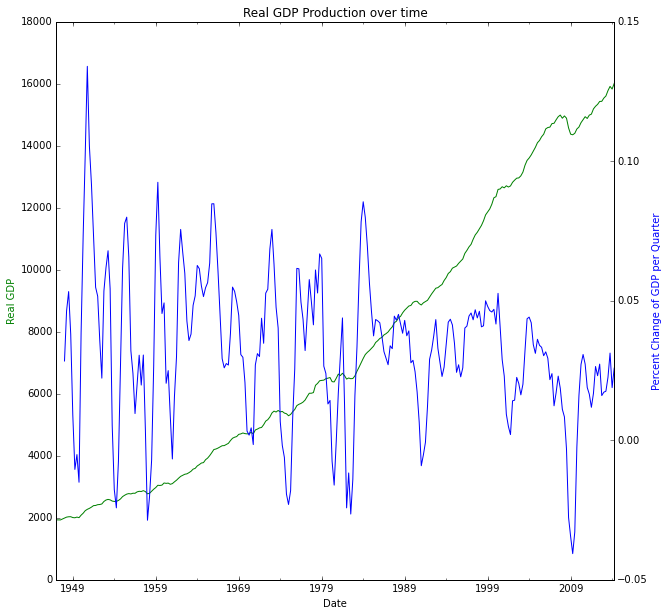

In [22]:
#5
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()

fig.set_size_inches(10, 10)
merged_data.GDPC1[merged_data.GDPC1.notnull()].plot(title='Real GDP Production over time', 
                                                      ax=ax1, style='g-')
merged_data.GDPC1[merged_data.GDPC1.notnull()].pct_change(4).plot(ax=ax2, style='b-')

ax1.set_ylabel('Real GDP', color='g')
ax2.set_ylabel('Percent Change of GDP per Quarter', color='b')

In [23]:
print "average GDP change per quarter %s" % merged_data.GDPC1[merged_data.GDPC1.notnull()].pct_change(1).mean()
print "average GDP change per year %s" % merged_data.GDPC1[merged_data.GDPC1.notnull()].pct_change(4).mean()

average GDP change per quarter 0.00793388088072
average GDP change per year 0.0324698978643


I'm not an expert on GDP growth, but we can see the growth varies between 4% increase to -3% growth per quarter.  Considering the quarter scale, it seems like this is pretty good growth.  The average growth is .8% or .008 per quarter or 3.24% per year.

Based upon the information at http://useconomy.about.com/od/grossdomesticproduct/f/Ideal_GDP.htm.  The rate of growth for this gdp seems pretty healthy overall since it doesn't go too high or stay too high and continues to allow for steady growth.

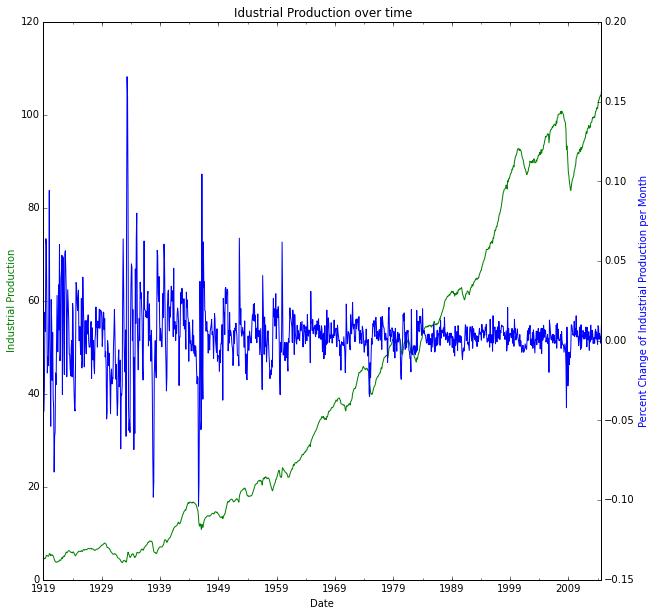

In [24]:
fig_indpro, ax1_indpro = plt.subplots()
ax2_indpro = ax1_indpro.twinx()

fig_indpro.set_size_inches(10, 10)
merged_data.INDPRO[merged_data.INDPRO.notnull()].plot(title='Idustrial Production over time', 
                                                      ax=ax1_indpro, style='g-')
merged_data.INDPRO[merged_data.INDPRO.notnull()].pct_change(1).plot(ax=ax2_indpro, style='b-')

ax1_indpro.set_ylabel('Industrial Production', color='g')
ax2_indpro.set_ylabel('Percent Change of Industrial Production per Month', color='b')


The industrial production graph is similiar to that of the GDP graph at a high level.  One might conclude that the industrial production level was affecting the GDP.  However, since the GDP is not defined by the industrial production level it seems like this is an indirect correlation.  Definition of GDP.  http://www.investopedia.com/terms/g/gdp.asp

However wikipedia suggests that is it a small component of the GDP and can be used as part of the forecast for the GDP.
https://en.wikipedia.org/wiki/Industrial_production

I was unable to find any data on what a good industrial production level is, but given that the GDP is strong and that the totaling industrial production level provided is high, I would conclude that this country is a relatively large exporter of manufactured goods which is contributing to the strong GDP.  On a quarterly basis the amount of change in the growth of the industrial production level is fairly constant which should be good for having a solid outlook for continued growth.

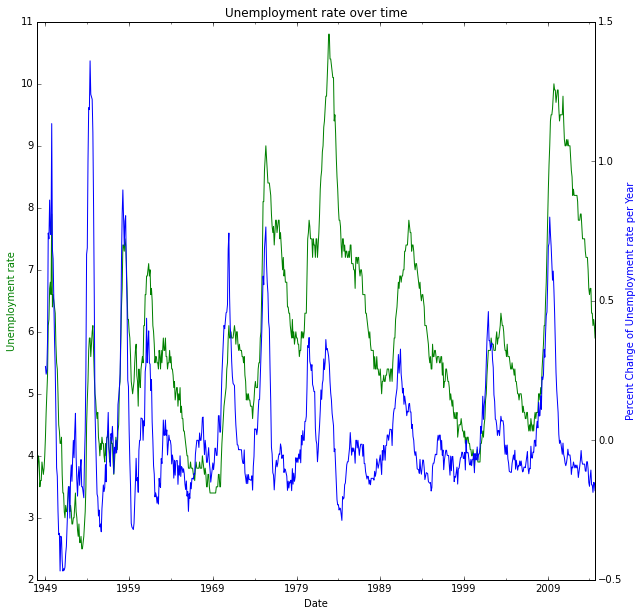

In [25]:
fig_enemp, ax1_enemp = plt.subplots()
ax2_enemp = ax1_enemp.twinx()

fig_enemp.set_size_inches(10, 10)
merged_data.UNRATE[merged_data.UNRATE.notnull()].plot(title='Unemployment rate over time', 
                                                      ax=ax1_enemp, style='g-')
merged_data.UNRATE[merged_data.UNRATE.notnull()].pct_change(12).plot(ax=ax2_enemp, style='b-')

ax1_enemp.set_ylabel('Unemployment rate', color='g')
ax2_enemp.set_ylabel('Percent Change of Unemployment rate per Year', color='b')


In [26]:
print "average unemployment rate change per month %s" % merged_data.UNRATE[merged_data.UNRATE.notnull()].pct_change().mean()
print "average unemployment rate change per year %s" % merged_data.UNRATE[merged_data.UNRATE.notnull()].pct_change(12).mean()
print "average unemployment rate %s" % merged_data.UNRATE[merged_data.UNRATE.notnull()].mean()

average unemployment rate change per month 0.00143572141263
average unemployment rate change per year 0.0339073033964
average unemployment rate 5.83333333333


A target or good unemployment rate is a number that changes depending upon the country and the state of that countries economy.  
https://en.wikipedia.org/wiki/Full_employment

Generally getting to a true full employment number means that the unemployment wouldn't be 0.  Generally for the US 4%-6% is believed to be a good range for the unemployment %.  If unemployment were actually at 0% then there is a concern that inflation would increase too quickly.  Also the unemployment rate will always have some amount of fictional unemployment which includes people who are transitioning between jobs or life changes such as students looking for jobs after school.  

What is interesting about this data is how much the unemployment rate is saw toothing between the various high levels / low levels.  To have a better representation of the change in unemployment I graphed the change in unemployment on a yearly basis.  This timescale lets us see that there are periods when unemployment doubles.  Generally these spikes are during periods of great economic issue like the great recession.  Based upon this data we could conclude that even though there are periods of difficulty for the country when unemployment spikes, the GDP was still able to generally trend upward over enough time and the level of industrial production continued to rise.

Also across the entire dataset the unemployment rate changes ~3.3 percent each year.  If a good employment rate is 4% - 6% then this variation can be as much as ~.2% a year.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f27f8fc1090>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x7f27eb2dced0>]], dtype=object)

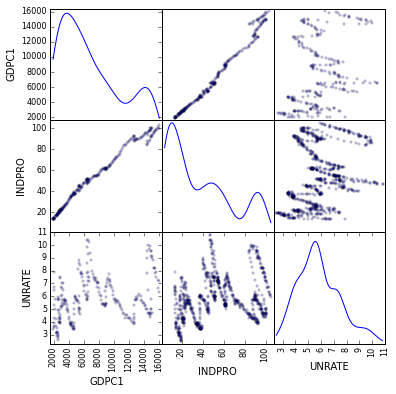

In [27]:
#6
pd.scatter_matrix(merged_data[["GDPC1", "INDPRO", "UNRATE"]], alpha=0.2, figsize=(6, 6), diagonal='kde')

**Nutrition dataset analysis**

Download the dataset from http://ashleyw.co.uk/files/foods-2011-10-03.json.zip
This data set is a compilation of data provided by the US department of Agriculture. The data set contains data for 6,636 unique foods and 94 unique nutrients (with an average of 56.5 nutrients per food)

Do the following

Use the built in python json module to load the food data into a python list

Your code should look like this

> import json
>
> db = json.load(open('foods-2011-10-03.json'))

db will be a list of 6636 python dictionaries, each containing nutritional information for a different food item. Each dictionary will have the following keys:

    1.portions
    2.description
    3.tags
    4.nutrients
    5.group
    6.id
    7.manufacture

Now, create a DataFrame of meta_data using the description, group, id, and manufacturer items in each dictionary.

Loop over db and construct a list of DataFrames containing the nutritional information for each record in db. Make sure to add a column to each of these DataFrames that contains the unique food id (id key in the dictionary)

Finally, use the pandas combining techniques to create a nutrients DataFrame. After you have done this drop duplicate entries in this DataFrame. For example, if you had named the objects nuts you would do

nuts = nuts.drop_duplicates()

Use the rename method to make sure that the description and group columns are un-ambiguous for both the meta_data DataFrame and the nutrients DataFrame (These column names are duplicated because every food has a description and group and each nutrient also has those identifiers). 

Finally, use the data combining routines to come up with a foods DataFrame containing all the meta_data and nutritional information. Make sure to do an outer style merge on the correct columns.

Using the foods DataFrame you have been building, compute the following things:

1. The food item with the highest content of each nutrient. 
2. A function that accepts a nutrient name and a quantile value and generates a horizontal bar plot of the amount of that nutrient in each food group. Provide a plot title. HINT: You will need to use the quantile and sort (or order ) methods in order for this to work. 

In [28]:
# !mkdir -p ../data/nutrition
# !curl http://ashleyw.co.uk/files/foods-2011-10-03.json.zip > ../data/nutrition/foods-2011-10-03.json.zip
# Note: the file at the linked location didn't work, a 404 error from facebook is found.
# So I have found a copy of the file in 
# https://github.com/pydata/pydata-book/tree/master/ch07
# and I am using that.  Please provide a copy of the data file if that isn't correct

In [29]:
%cd /local/mnt/c6sander/DSE200/data/nutrition/

/local/mnt/c6sander/DSE200/data/nutrition


In [30]:
!pwd
%cd ../nutrition/

/local/mnt/c6sander/DSE200/data/nutrition
/local/mnt/c6sander/DSE200/data/nutrition


In [31]:
import json
db = json.load(open('foods-2011-10-03.json'))

In [32]:
meta_data_keys = ['description', 'group', 'id', 'manufacturer']
meta_data = pd.DataFrame(db, columns=meta_data_keys)

In [33]:
meta_data.head()

,description,group,id,manufacturer
0,"Cheese, caraway",Dairy and Egg Products,1008,
1,"Cheese, cheddar",Dairy and Egg Products,1009,
2,"Cheese, edam",Dairy and Egg Products,1018,
3,"Cheese, feta",Dairy and Egg Products,1019,
4,"Cheese, mozzarella, part skim milk",Dairy and Egg Products,1028,


In [34]:
nutrients = []

for rec in db:
    df_nuts = pd.DataFrame(rec['nutrients'])
    df_nuts['id'] = rec['id']
    nutrients.append(df_nuts)

nutrients = pd.concat(nutrients, ignore_index=True)
print "duplicates?: %s" % nutrients.duplicated().sum()
nutrients = nutrients.drop_duplicates()
print "duplicates?: %s" % nutrients.duplicated().sum()

duplicates?: 14179
duplicates?: 0


In [35]:
nutrients.head()

,description,group,units,value,id
0,Protein,Composition,g,25.18,1008
1,Total lipid (fat),Composition,g,29.20,1008
2,"Carbohydrate, by difference",Composition,g,3.06,1008
3,Ash,Other,g,3.28,1008
4,Energy,Energy,kcal,376.00,1008


In [36]:
meta_data.head()

,description,group,id,manufacturer
0,"Cheese, caraway",Dairy and Egg Products,1008,
1,"Cheese, cheddar",Dairy and Egg Products,1009,
2,"Cheese, edam",Dairy and Egg Products,1018,
3,"Cheese, feta",Dairy and Egg Products,1019,
4,"Cheese, mozzarella, part skim milk",Dairy and Egg Products,1028,


In [37]:
nutrients_col_map = {'description': 'nutrient_description',
                     'group': 'nutrient_group'}
nutrients = nutrients.rename(columns=nutrients_col_map)
nutrients.count()

nutrient_description    375176
nutrient_group          375176
units                   375176
value                   375176
id                      375176
dtype: int64

In [38]:
meta_data_col_map = {'description': 'meta_data_description',
                     'group': 'meta_data_group'}
meta_data = meta_data.rename(columns=meta_data_col_map)
meta_data.count()

meta_data_description    6636
meta_data_group          6636
id                       6636
manufacturer             5195
dtype: int64

In [39]:
foods = pd.merge(meta_data, nutrients, on='id', how='outer')
print foods.count()
foods

meta_data_description    375176
meta_data_group          375176
id                       375176
manufacturer             293054
nutrient_description     375176
nutrient_group           375176
units                    375176
value                    375176
dtype: int64


,meta_data_description,meta_data_group,id,manufacturer,nutrient_description,nutrient_group,units,value
0,"Cheese, caraway",Dairy and Egg Products,1008,,Protein,Composition,g,25.180
1,"Cheese, caraway",Dairy and Egg Products,1008,,Total lipid (fat),Composition,g,29.200
2,"Cheese, caraway",Dairy and Egg Products,1008,,"Carbohydrate, by difference",Composition,g,3.060
3,"Cheese, caraway",Dairy and Egg Products,1008,,Ash,Other,g,3.280
4,"Cheese, caraway",Dairy and Egg Products,1008,,Energy,Energy,kcal,376.000
5,"Cheese, caraway",Dairy and Egg Products,1008,,Water,Composition,g,39.280
6,"Cheese, caraway",Dairy and Egg Products,1008,,Energy,Energy,kJ,1573.000
7,"Cheese, caraway",Dairy and Egg Products,1008,,"Fiber, total dietary",Composition,g,0.000
8,"Cheese, caraway",Dairy and Egg Products,1008,,"Calcium, Ca",Elements,mg,673.000
9,"Cheese, caraway",Dairy and Egg Products,1008,,"Iron, Fe",Elements,mg,0.640


In [40]:
#1. The food item with the highest content of each nutrient.
# if this question is just looking for a single food item for each nutrient then the following will work as solution
nut_group = foods.groupby('nutrient_description')
nut_group.max()

,meta_data_description,meta_data_group,id,manufacturer,nutrient_group,units,value
nutrient_description,,,,,,,
Adjusted Protein,"Mushrooms, white, raw",Vegetables and Vegetable Products,19078,,Composition,g,12.900
Alanine,"Yogurt, vanilla, low fat, 11 grams protein per...",Vegetables and Vegetable Products,90240,"Wendy's International, Inc.",Amino Acids,g,8.009
"Alcohol, ethyl","Yogurt, vanilla, low fat, 11 grams protein per...",Vegetables and Vegetable Products,93600,"The Quaker Oats, Co.",Other,g,42.500
Arginine,"Yogurt, vanilla, low fat, 11 grams protein per...",Vegetables and Vegetable Products,90240,"Wendy's International, Inc.",Amino Acids,g,7.436
Ash,"Yogurt, vanilla, low fat, 11 grams protein per...",Vegetables and Vegetable Products,93600,"Worthington Foods, Inc.",Other,g,72.500
Aspartic acid,"Yogurt, vanilla, low fat, 11 grams protein per...",Vegetables and Vegetable Products,90240,"Wendy's International, Inc.",Amino Acids,g,10.203
Beta-sitosterol,"T.G.I. FRIDAY'S, French fries",Vegetables and Vegetable Products,43215,T.G.I Friday's,Other,mg,426.000
Betaine,"Yogurt, fruit variety, nonfat, fortified with ...",Vegetables and Vegetable Products,43570,"Wendy's International, Inc.",Vitamins,mg,630.400
Caffeine,"Yogurt, vanilla, low fat, 11 grams protein per...",Vegetables and Vegetable Products,93600,"Wendy's International, Inc.",Other,mg,3680.000


In [285]:
#1. The food item with the highest content of each nutrient.
# if this question is looking for all foods that have the highest value of a nutrient then
# get the highest value per nutrient
max_foods = foods[foods.groupby(['nutrient_description'])['value'].transform(max) == foods['value']]
print max_foods.count()
max_foods

meta_data_description    151
meta_data_group          151
id                       151
manufacturer             124
nutrient_description     151
nutrient_group           151
units                    151
value                    151
dtype: int64


,meta_data_description,meta_data_group,id,manufacturer,nutrient_description,nutrient_group,units,value
5893,"Spices, paprika",Spices and Herbs,2028,,"Cryptoxanthin, beta",Vitamins,mcg,6186.000
6424,"Spices, sage, ground",Spices and Herbs,2038,,Vitamin K (phylloquinone),Vitamins,mcg,1714.500
11876,"Infant formula, MEAD JOHNSON, ENFAMIL, with ir...",Baby Foods,3805,None,Lactose,Sugars,g,56.000
12031,"Infant formula, MEAD JOHNSON, ENFAMIL, LIPIL, ...",Baby Foods,3808,None,Lactose,Sugars,g,56.000
12082,"Infant formula, MEAD JOHNSON, ENFAMIL, low iro...",Baby Foods,3809,None,Lactose,Sugars,g,56.000
12389,"Infant formula, MEAD JOHNSON, ENFAMIL, LIPIL, ...",Baby Foods,3817,None,Lactose,Sugars,g,56.000
14385,"Infant formula, MEAD JOHNSON, ENFAMIL, LACTOFR...",Baby Foods,3869,None,Glucose (dextrose),Sugars,g,57.000
17197,"Salad dressing, russian dressing, low calorie",Fats and Oils,2066,,"Iron, Fe",Elements,mg,87.470
17389,"Oil, wheat germ",Fats and Oils,4038,,Total lipid (fat),Composition,g,100.000
17414,"Oil, wheat germ",Fats and Oils,4038,,Vitamin E (alpha-tocopherol),Vitamins,mg,149.400


In [286]:
max_foods[max_foods['nutrient_description'] == 'Water']

,meta_data_description,meta_data_group,id,manufacturer,nutrient_description,nutrient_group,units,value
322993,"Water, bottled, POLAND SPRING",Beverages,14385,Nestle Waters North America Inc.,Water,Composition,g,100
324209,"Water, bottled, non-carbonated, CALISTOGA",Beverages,14437,Nestle Waters North America Inc.,Water,Composition,g,100
324221,"Water, bottled, non-carbonated, CRYSTAL GEYSER",Beverages,14438,Crystal Geyser Alpine Spring Water,Water,Composition,g,100
324233,"Water, bottled, non-carbonated, NAYA",Beverages,14439,NAYA Inc.,Water,Composition,g,100


In [44]:
result = foods.groupby(['nutrient_description', 'meta_data_group'])
result['value'].quantile(0.5)
#result = foods.groupby(['nutrient_description', 'meta_data_description'])['value'].quantile(.5)
#result['Zinc, Zn'].order().plot(kind='barh')

nutrient_description  meta_data_group                  
Adjusted Protein      Sweets                               12.9000
                      Vegetables and Vegetable Products     2.1800
Alanine               Baby Foods                            0.0850
                      Baked Products                        0.2480
                      Beef Products                         1.5500
                      Beverages                             0.0030
                      Breakfast Cereals                     0.3110
                      Cereal Grains and Pasta               0.3730
                      Dairy and Egg Products                0.2710
                      Ethnic Foods                          1.2900
                      Fast Foods                            0.5140
                      Fats and Oils                         0.0000
                      Finfish and Shellfish Products        1.2180
                      Fruits and Fruit Juices               0.0270
      

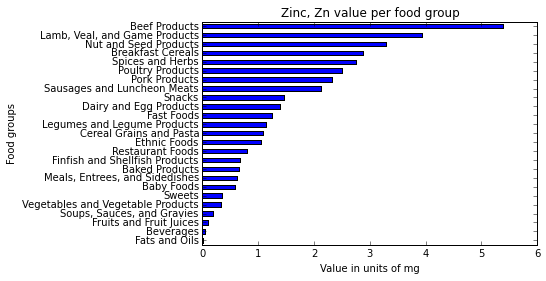

In [45]:
#2. A function that accepts a nutrient name and a quantile value and generates a horizontal bar plot
#   of the amount of that nutrient in each food group. Provide a plot title. HINT: You will need to
#   use the quantile and sort (or order ) methods in order for this to work. 
def generate_plot(nutrient_name, quantile_value):
    grouped = foods.groupby(['nutrient_description', 'meta_data_group'])
    result = grouped['value'].quantile(quantile_value)
    tmp = foods[foods['nutrient_description'] == nutrient_name]['units'].unique()
    units = ''
    for i in tmp:
        units += i + ' '
    ax = result[nutrient_name].order().plot(kind='barh', title='%s value per food group' % nutrient_name)
    ax.set_xlabel('Value in units of %s' % units)
    ax.set_ylabel('Food groups')
    
generate_plot('Zinc, Zn', .5)

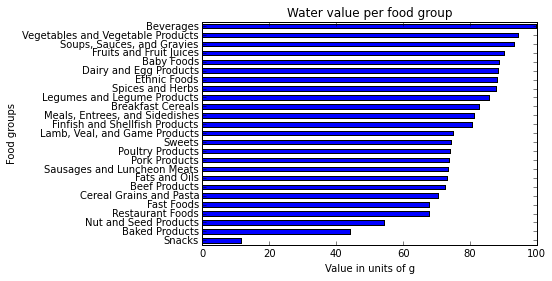

In [34]:
generate_plot('Water', .9)

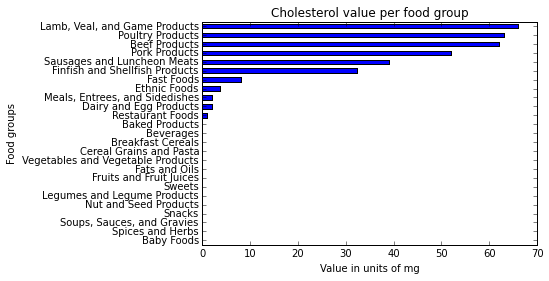

In [402]:
generate_plot('Cholesterol', .1)

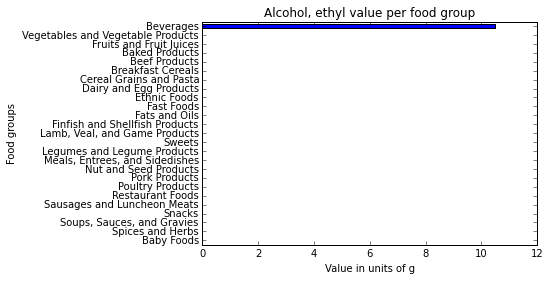

In [401]:
generate_plot('Alcohol, ethyl', .85)

**Classifying Digits**
SKLearn has many intereting datasets pre-loaded in it, one of which is load_digits (sklearn.datasets.load_digits - http://scikit-learn.org/stable/modules/generated/sklearn.datasets.load_digits.html). Load_digits is a dataset of digits, with each datapoint being a 8x8 image of a digit. 

You can load this dataset as follows

In [46]:
from sklearn.datasets import load_digits
digits = load_digits()
print(digits.data.shape)

(1797, 64)


And the images can be visualized as follows

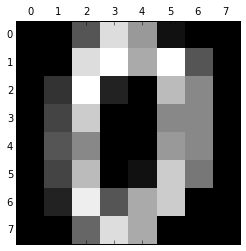

In [47]:
import pylab as pl 
pl.gray() 
pl.matshow(digits.images[0]) 
pl.show()

1. Visualize the first 15 digits to get a better understanding of the data
2. With x as data and y as target, classify the above datasets into individual targets using a decision tree
3. Perform this classification task with sklearn.svm.SVC. How does the choice of kernel affect the results?
4. Perform this classification task with sklearn.ensemble.RandomForestClassifier. Write in the markdown below the impact each of the parammeter had on the result



        1. max_depth: increasing the max_depth beyond 20 (when only increasing the max_depth) didn't improve the score
        2. max_features: increasing the max_features beyond 15 (when only increasing the max_features) didn't improve
            the score
        3. n_estimators: generally increasing the n_estimators did improve the score, however each discrete value
            increase did not.  However if you keep increasing it seems to improve until it eventually hits a perfect
            score of 1.  (that's my conjector, I didn't keep increasing until I hit 1.0 for a score)


Try a few sets of parameters for each model and check the F1 score (sklearn.metrics.f1_score) on your results. Output the best F1 score that you achieve. 

The best score that I got was the following:

.994428 and that was with a max_depth of 20, max_features of 10 and n_estimators of 55.  This can be seen in the output of my dataframe below.

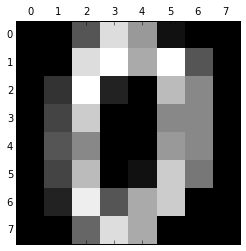

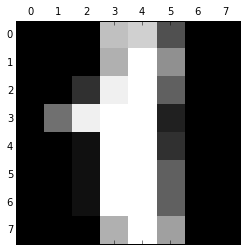

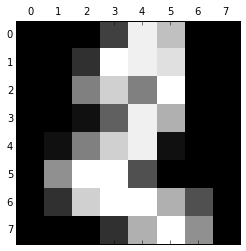

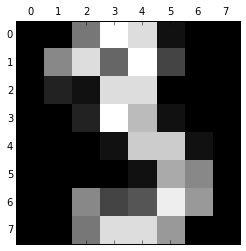

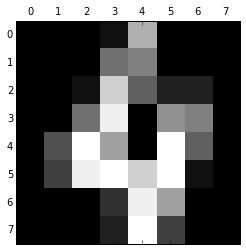

...

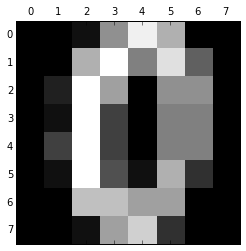

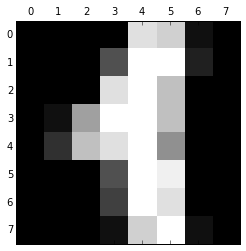

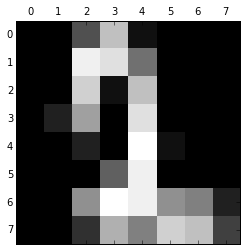

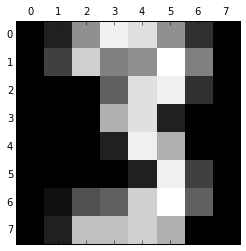

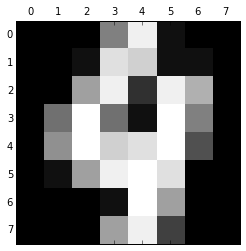

In [49]:
# 1 Visualize the first 15 digits
for i in range(0, 15):
    pl.matshow(digits.images[i]) 
    pl.show() 

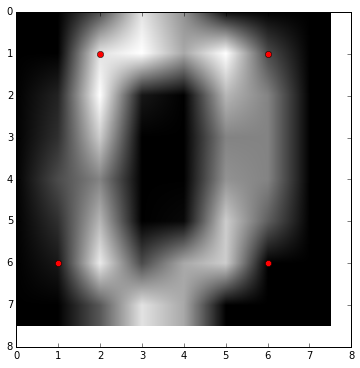

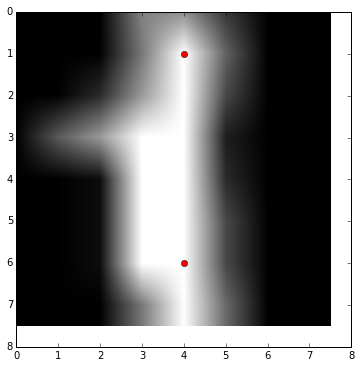

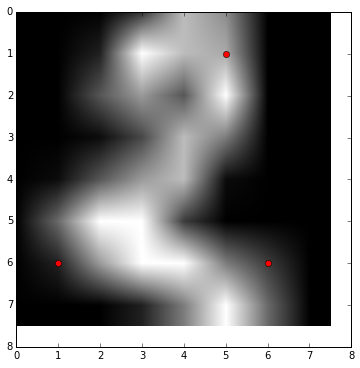

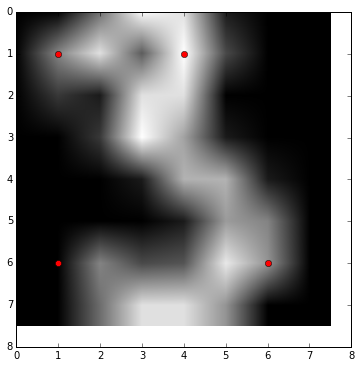

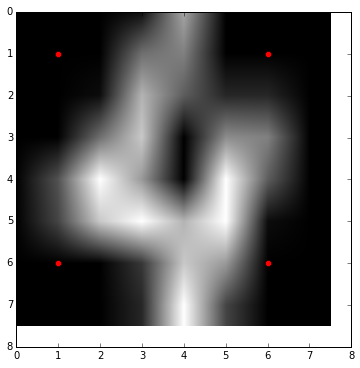

...

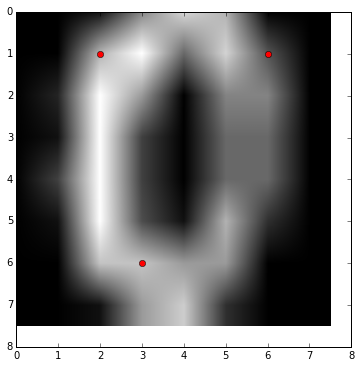

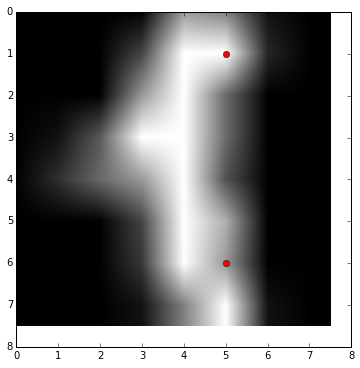

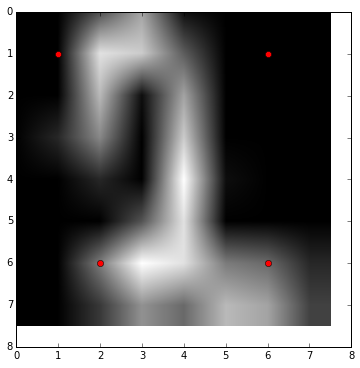

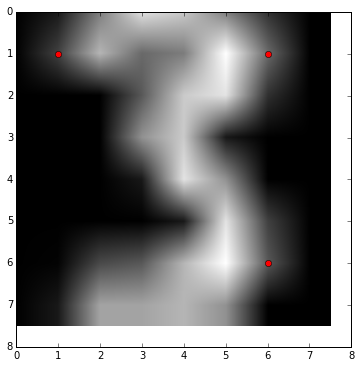

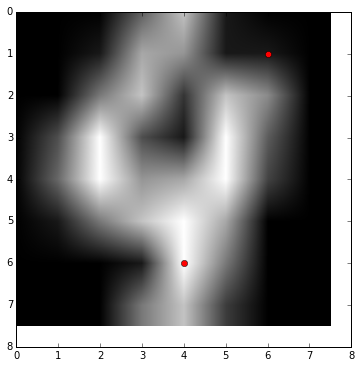

In [347]:
# code from mastering machine learning by Gavin Hackeling to highlight the peak points in the data
# to visualize the important peak points in the dataset
from skimage.feature import corner_harris, corner_peaks, peak_local_max
from skimage.color import rgb2gray
import skimage.io as io
from skimage.exposure import equalize_hist

def show_important_points(digit_image):
    def show_corners(corners, image):
        fig = plt.figure()
        plt.gray()
        plt.imshow(image)
        y_corner, x_corner = zip(*corners)
        plt.plot(x_corner, y_corner, 'or')
        plt.xlim(0, image.shape[1])
        plt.ylim(image.shape[0], 0)
        fig.set_size_inches(np.array(fig.get_size_inches()) * 1.5)
        plt.show()
    
    digit_image = equalize_hist(rgb2gray(digit_image))
    # print "digit_image: %s" % digit_image
    # print "corner_harris: %s" % corner_harris(digit_image)
    corners = corner_peaks(corner_harris(digit_image), exclude_border=False, min_distance=2)
    # print "corners: %s" % corners
    show_corners(corners, digit_image)

for i in range(0, 15):
    show_important_points(digits.images[i])


In [ ]:
# add stuff for the other parameters and whatnot

#gini is the impurity number
# you don't want a gini score of over 50%

# what exactly is the f1 score and what is it doing
# apaprently it isn't the pure % of getting it right

# randomize is just for splitting train / test

# use confusion matrix.  the values in the matrix are the counts.  The diagonal is the "right" answers.
# use accuracy??

In [325]:
!pwd

/local/mnt/c6sander/DSE200/day_3_models_and_learning


In [ ]:
%cd ../../day_3_models_and_learning/

In [326]:
#2 With x as data and y as target, classify the above datasets into individual targets using a decision tree
# train the decision tree with the data
from sklearn.tree import DecisionTreeClassifier

# split the data into test and train data
clf = DecisionTreeClassifier()
clf = clf.fit(digits.data, digits.target)

In [327]:
import pydot
filename='digits_full.dot'
sk.tree.export_graphviz(clf, out_file=filename) 
graph = pydot.graph_from_dot_file(filename) 
#graph.write_ps('digits.ps')
graph.write_fig('digits_full.fig')
# note: I couldn't get pydot to install in a way that supported pdf or jpeg conversion natively...
# I tried a bunch of different tools to get the conversion to work inline, but none of them could handle a tree of
# this size
#graph.write_pdf('digits.pdf')

True

In [328]:
# convert ps to pdf...however pdf doesn't show natively in a notebook
#!ps2pdf digits.ps digits.pdf

#wand prereqs...commented out but needs to be installed via the repo manager for the appropriate OS
#    libmagickwand-dev and sudo apt-get install libmagickcore5-extra via APT on Debian/Ubuntu
#    imagemagick for MacPorts/Homebrew on Mac
#    ImageMagick-devel for Yum on CentOS
# then download wand https://pypi.python.org/pypi/Wand and install.  wand in the conda repo didn't
# install since the repo is empty for linux distribution

In [330]:
# this image is the full decision tree with all of the data trained (ie: overbinned)
from wand.image import Image as WImage
img = WImage(filename='digits_full.jpg')
img
# this image had to be processed from a program called xfig.
# to view it you will need to copy it out of the notebook since the notebook doesn't support zoom

In [365]:
# training the decision tree with all of the data results in overbinning, so we should split the dataset into
# a train and test section
from sklearn.tree import DecisionTreeClassifier
from sklearn.cross_validation import train_test_split

# split the data into test and train data
X_train, X_test, Y_train, Y_test = train_test_split(digits.data, digits.target, test_size=0.4, random_state=4)
clf = DecisionTreeClassifier()
clf = clf.fit(X_train, Y_train)


In [366]:
filename='digits_trained.dot'
sk.tree.export_graphviz(clf, out_file=filename) 
graph = pydot.graph_from_dot_file(filename) 
#graph.write_ps('digits.ps')
graph.write_fig('digits_trained.fig')
# note: I couldn't get pydot to install in a way that supported pdf or jpeg conversion natively...
# I tried a bunch of different tools to get the conversion to work inline, but none of them could handle a tree of
# this size
#graph.write_pdf('digits.pdf')

True

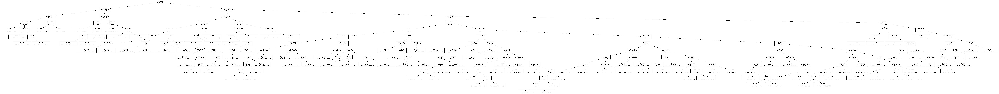

In [367]:
from IPython.display import Image
Image(filename='digits_trained.jpg')

It's hard to tell from just the tree, but we should generally see a smaller decision tree.  The decision tree using a reduced dataset is less detailed and therefore shouldn't be overfitting as the decision tree using the entire dataset.  We could further refine the tree but doing things like setting the max depth value on the tree to limit how many decisions can be made and allow for more generic results.

Score: 0.877777777778
Accuracy: 0.877777777778
Confusion matrix:
[[36  0  0  0  1  1  0  0  0  0]
 [ 1 25  2  0  0  0  0  0  3  1]
 [ 0  1 39  0  0  0  0  0  1  0]
 [ 0  0  1 25  2  2  0  0  3  0]
 [ 0  1  0  0 32  1  0  3  0  0]
 [ 0  0  0  0  0 37  0  0  1  0]
 [ 0  0  0  0  3  0 31  1  0  0]
 [ 0  0  0  1  1  0  0 35  0  1]
 [ 0  2  1  1  0  0  0  0 29  0]
 [ 0  0  0  0  1  3  0  2  2 27]]
Score: 0.861111111111
Accuracy: 0.861111111111
Confusion matrix:
[[36  0  0  0  0  1  0  0  0  1]
 [ 0 25  4  0  0  0  0  0  2  1]
 [ 1  2 37  0  0  0  1  0  0  0]
 [ 0  0  1 25  1  1  0  0  4  1]
 [ 0  1  0  0 30  1  1  4  0  0]
 [ 0  0  0  0  0 37  0  0  1  0]
 [ 0  1  0  0  1  1 29  2  1  0]
 [ 0  0  0  1  1  0  0 35  0  1]
 [ 0  3  1  0  0  0  0  0 29  0]
 [ 0  1  0  0  0  4  0  2  1 27]]
Score: 0.847222222222
Accuracy: 0.847222222222
Confusion matrix:
[[36  0  0  0  0  1  0  0  0  1]
 [ 0 25  3  0  0  0  1  0  2  1]
 [ 1  2 37  0  0  0  1  0  0  0]
 [ 0  0  1 25  2  0  1  0  3  1]
 [ 0  1  0 

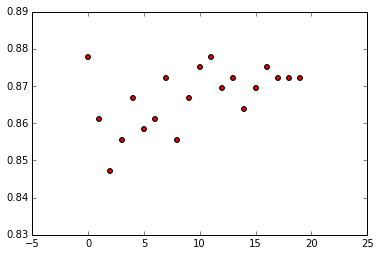

In [411]:
# output the decision surface to show how well the trained decision tree does
from sklearn.tree import DecisionTreeClassifier
from sklearn import preprocessing, metrics

# split data into test and train
from sklearn.cross_validation import train_test_split

scores = {}
accuracy_values = {}
for i in xrange(20):
    X_train, X_test, Y_train, Y_test = train_test_split(digits.data, digits.target, test_size=0.2, random_state=4)

    # Train
    # DecisionTreeClassifier has a randomness to it, to set it with a seed use
    # random_state=42
    clf = DecisionTreeClassifier().fit(X_train, Y_train)
    predictions = clf.predict(X_test)
    score = clf.score(X_test, Y_test)
    # print 'Accuracy:', score
    scores[i] = score
    print "Score: %s" % score
    accuracy = metrics.accuracy_score(Y_test, predictions)
    accuracy_values[i] = accuracy
    print "Accuracy: %s" % accuracy
    print "Confusion matrix:\n%s" % metrics.confusion_matrix(Y_test, predictions)

# graph the range in scores
X, Y = scores.keys(), scores.values()
plt.scatter(X, Y, c='b')
X, Y = accuracy_values.keys(), accuracy_values.values()
plt.scatter(X, Y, c='r')
print "min: %s" % min(scores.values())
print "max: %s" % max(scores.values())

# 3. Perform this classification task with sklearn.svm.SVC. How does the choice of kernel affect the results?

Automatically created module for IPython interactive environment


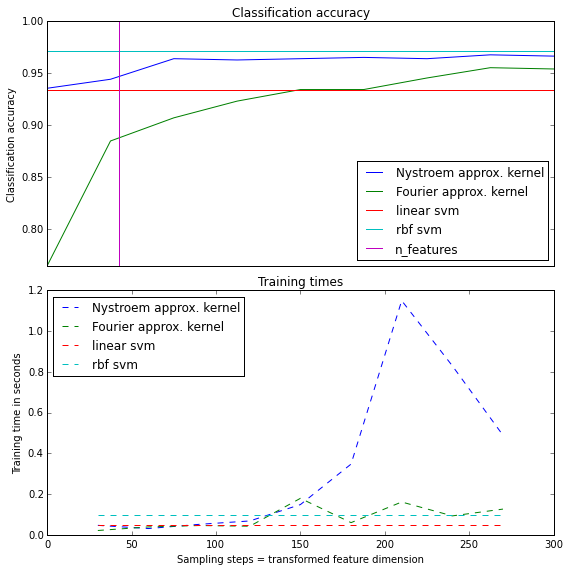

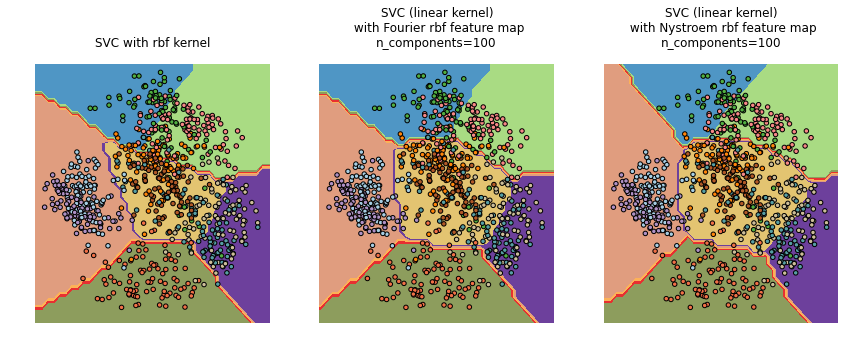

In [413]:
# General kernel comparison information
# http://scikit-learn.org/stable/auto_examples/plot_kernel_approximation.html
print(__doc__)

# Author: Gael Varoquaux <gael dot varoquaux at normalesup dot org>
#         Andreas Mueller <amueller@ais.uni-bonn.de>
# License: BSD 3 clause

# Standard scientific Python imports
import matplotlib.pyplot as plt
import numpy as np
from time import time

# Import datasets, classifiers and performance metrics
from sklearn import datasets, svm, pipeline
from sklearn.kernel_approximation import (RBFSampler,
                                          Nystroem)
from sklearn.decomposition import PCA

# The digits dataset
digits = datasets.load_digits(n_class=9)

# To apply an classifier on this data, we need to flatten the image, to
# turn the data in a (samples, feature) matrix:
n_samples = len(digits.data)
data = digits.data / 16.
data -= data.mean(axis=0)

# We learn the digits on the first half of the digits
data_train, targets_train = data[:n_samples / 2], digits.target[:n_samples / 2]


# Now predict the value of the digit on the second half:
data_test, targets_test = data[n_samples / 2:], digits.target[n_samples / 2:]
#data_test = scaler.transform(data_test)

# Create a classifier: a support vector classifier
kernel_svm = svm.SVC(gamma=.2)
linear_svm = svm.LinearSVC()

# create pipeline from kernel approximation
# and linear svm
feature_map_fourier = RBFSampler(gamma=.2, random_state=1)
feature_map_nystroem = Nystroem(gamma=.2, random_state=1)
fourier_approx_svm = pipeline.Pipeline([("feature_map", feature_map_fourier),
                                        ("svm", svm.LinearSVC())])

nystroem_approx_svm = pipeline.Pipeline([("feature_map", feature_map_nystroem),
                                        ("svm", svm.LinearSVC())])

# fit and predict using linear and kernel svm:

kernel_svm_time = time()
kernel_svm.fit(data_train, targets_train)
kernel_svm_score = kernel_svm.score(data_test, targets_test)
kernel_svm_time = time() - kernel_svm_time

linear_svm_time = time()
linear_svm.fit(data_train, targets_train)
linear_svm_score = linear_svm.score(data_test, targets_test)
linear_svm_time = time() - linear_svm_time

sample_sizes = 30 * np.arange(1, 10)
fourier_scores = []
nystroem_scores = []
fourier_times = []
nystroem_times = []

for D in sample_sizes:
    fourier_approx_svm.set_params(feature_map__n_components=D)
    nystroem_approx_svm.set_params(feature_map__n_components=D)
    start = time()
    nystroem_approx_svm.fit(data_train, targets_train)
    nystroem_times.append(time() - start)

    start = time()
    fourier_approx_svm.fit(data_train, targets_train)
    fourier_times.append(time() - start)

    fourier_score = fourier_approx_svm.score(data_test, targets_test)
    nystroem_score = nystroem_approx_svm.score(data_test, targets_test)
    nystroem_scores.append(nystroem_score)
    fourier_scores.append(fourier_score)

# plot the results:
plt.figure(figsize=(8, 8))
accuracy = plt.subplot(211)
# second y axis for timeings
timescale = plt.subplot(212)

accuracy.plot(sample_sizes, nystroem_scores, label="Nystroem approx. kernel")
timescale.plot(sample_sizes, nystroem_times, '--',
               label='Nystroem approx. kernel')

accuracy.plot(sample_sizes, fourier_scores, label="Fourier approx. kernel")
timescale.plot(sample_sizes, fourier_times, '--',
               label='Fourier approx. kernel')

# horizontal lines for exact rbf and linear kernels:
accuracy.plot([sample_sizes[0], sample_sizes[-1]],
              [linear_svm_score, linear_svm_score], label="linear svm")
timescale.plot([sample_sizes[0], sample_sizes[-1]],
               [linear_svm_time, linear_svm_time], '--', label='linear svm')

accuracy.plot([sample_sizes[0], sample_sizes[-1]],
              [kernel_svm_score, kernel_svm_score], label="rbf svm")
timescale.plot([sample_sizes[0], sample_sizes[-1]],
               [kernel_svm_time, kernel_svm_time], '--', label='rbf svm')

# vertical line for dataset dimensionality = 64
accuracy.plot([64, 64], [0.7, 1], label="n_features")

# legends and labels
accuracy.set_title("Classification accuracy")
timescale.set_title("Training times")
accuracy.set_xlim(sample_sizes[0], sample_sizes[-1])
accuracy.set_xticks(())
accuracy.set_ylim(np.min(fourier_scores), 1)
timescale.set_xlabel("Sampling steps = transformed feature dimension")
accuracy.set_ylabel("Classification accuracy")
timescale.set_ylabel("Training time in seconds")
accuracy.legend(loc='best')
timescale.legend(loc='best')

# visualize the decision surface, projected down to the first
# two principal components of the dataset
pca = PCA(n_components=8).fit(data_train)

X = pca.transform(data_train)

# Gemerate grid along first two principal components
multiples = np.arange(-2, 2, 0.1)
# steps along first component
first = multiples[:, np.newaxis] * pca.components_[0, :]
# steps along second component
second = multiples[:, np.newaxis] * pca.components_[1, :]
# combine
grid = first[np.newaxis, :, :] + second[:, np.newaxis, :]
flat_grid = grid.reshape(-1, data.shape[1])

# title for the plots
titles = ['SVC with rbf kernel',
          'SVC (linear kernel)\n with Fourier rbf feature map\n'
          'n_components=100',
          'SVC (linear kernel)\n with Nystroem rbf feature map\n'
          'n_components=100']

plt.tight_layout()
plt.figure(figsize=(12, 5))

# predict and plot
for i, clf in enumerate((kernel_svm, nystroem_approx_svm,
                         fourier_approx_svm)):
    # Plot the decision boundary. For that, we will assign a color to each
    # point in the mesh [x_min, m_max]x[y_min, y_max].
    plt.subplot(1, 3, i + 1)
    Z = clf.predict(flat_grid)

    # Put the result into a color plot
    Z = Z.reshape(grid.shape[:-1])
    plt.contourf(multiples, multiples, Z, cmap=plt.cm.Paired)
    plt.axis('off')

    # Plot also the training points
    plt.scatter(X[:, 0], X[:, 1], c=targets_train, cmap=plt.cm.Paired)

    plt.title(titles[i])
plt.tight_layout()
plt.show()

The choice of the kernal affects the classification accuracy, and training times.  Based upon the output abov the linear svm and rbf svm (which is the default) have a static accuracy as well as a constant training time.  The rbf svm has a higher accuracy than linear svm but also have a longer training time.  The accuracy of nystroem and fourier were both lower than that of the rbf svm but had varying training times based upon the number of sampling steps.

For kernel: linear
Score: 0.987654320988
Confusion matrix:
[[46  0  0  0  0  0  0  0  0]
 [ 0 38  0  0  0  0  0  0  0]
 [ 0  0 34  0  0  0  0  0  0]
 [ 0  0  0 36  0  0  0  0  0]
 [ 0  0  0  0 42  0  0  0  0]
 [ 0  0  0  1  0 36  0  0  0]
 [ 0  0  0  0  0  0 31  0  0]
 [ 0  0  0  0  0  0  0 32  0]
 [ 0  1  1  0  0  1  0  0 25]]

For kernel: poly
Score: 0.996913580247
Confusion matrix:
[[46  0  0  0  0  0  0  0  0]
 [ 0 38  0  0  0  0  0  0  0]
 [ 0  0 34  0  0  0  0  0  0]
 [ 0  0  0 36  0  0  0  0  0]
 [ 0  0  0  0 42  0  0  0  0]
 [ 0  0  0  1  0 36  0  0  0]
 [ 0  0  0  0  0  0 31  0  0]
 [ 0  0  0  0  0  0  0 32  0]
 [ 0  0  0  0  0  0  0  0 28]]

For kernel: rbf
Score: 0.564814814815
Confusion matrix:
[[23  0  0  0  0  0  0  0 23]
 [ 0 21  0  0  0  0  0  0 17]
 [ 0  0 15  0  0  0  0  0 19]
 [ 0  0  0 26  0  0  0  0 10]
 [ 0  0  0  0 14  0  0  0 28]
 [ 0  0  0  0  0 14  0  0 23]
 [ 0  0  0  0  0  0 23  0  8]
 [ 0  0  0  0  0  0  0 19 13]
 [ 0  0  0  0  0  0  0  0 28]]

For kernel: 

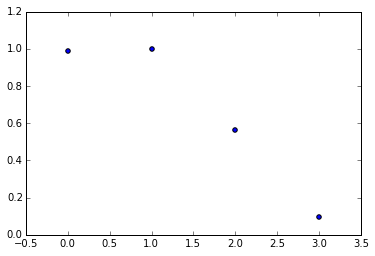

In [428]:
from sklearn import svm

scores = {}
kernels =  ['linear', 'poly', 'rbf', 'sigmoid']
X_train, X_test, Y_train, Y_test = train_test_split(digits.data, digits.target, test_size=0.2, random_state=4)
for index in xrange(len(kernels)):
    print "For kernel: %s" % kernels[index]

    # Train
    clf = svm.SVC(kernel=kernels[index]).fit(X_train, Y_train)
    predictions = clf.predict(X_test)
    score = clf.score(X_test, Y_test)
    print "Score: %s" % score
    scores[index] = score

    print "Confusion matrix:\n%s\n" % metrics.confusion_matrix(Y_test, predictions)
    
# graph the range in scores
X, Y = scores.keys(), scores.values()
print "X: %s Y: %s" % (kernels, Y)
plt.scatter(X, Y)
print "min: %s" % min(scores.values())
print "max: %s" % max(scores.values())

It looks like the linear and poly kernel do a really good job of estimating the data.  The rbf and sigmoid do not.  It looks like the choice of the kernel has a very large impact on the ability to predict the correct values.

In [ ]:
#4 random forest question

In [470]:
from sklearn.ensemble import RandomForestClassifier

n = len(digits.images)

# Convert the image matrix into a flatter matrix
digit_dat = digits.images.reshape(n, -1)
random.seed(2)
features_train, features_test, targets_train, targets_test = train_test_split(digits.data, digits.target,
                                                                              test_size=0.2, random_state=4)
max_depth = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55]
max_features = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55]
n_estimators = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55]
scores = []

for selected_depth in max_depth:
    for selected_feature in max_features:
        for selected_estimator in n_estimators:
            classify = RandomForestClassifier(max_depth=selected_depth, max_features=selected_feature,
                                              n_estimators=selected_estimator)
            start_train_time = time()
            classify.fit(features_train, targets_train)
            end_train_time = time()
            total_train_time = end_train_time - start_train_time
            # Use the predict function on the second half of the data to predict
            expected = targets_test
            start_predict_time = time()
            predicted = classify.predict(features_test)
            end_predict_time = time()
            total_predict_time = end_predict_time - start_predict_time
            f1score = metrics.f1_score(expected, predicted, average='macro')
            scores.append({'max_depth': selected_depth, 'max_features': selected_feature,
                           'n_estimators': selected_estimator, 'score': f1score, 'train_time': total_train_time,
                           'predict_time': total_predict_time})
            print "F1 score with max_depth: %s max_features: %s n_estimators: %s as parameters = %s\n" % \
                (selected_depth, selected_feature, selected_estimator, f1score)
            print("Classification report %s:\n%s\n" % (classify, metrics.classification_report(expected, predicted)))
            print("Confusion matrix:\n%s\n" % metrics.confusion_matrix(expected, predicted))

df = pd.DataFrame(scores)
df.max()

F1 score with max_depth: 5 max_features: 5 n_estimators: 5 as parameters = 0.885119947173

Classification report RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=5, max_features=5, max_leaf_nodes=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=5, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False):
             precision    recall  f1-score   support

          0       0.92      0.96      0.94        46
          1       0.92      0.87      0.89        38
          2       0.94      0.88      0.91        34
          3       0.94      0.92      0.93        36
          4       0.90      0.83      0.86        42
          5       0.84      0.86      0.85        37
          6       0.86      0.97      0.91        31
          7       0.88      0.94      0.91        32
          8       0.78      0.75      0.76        28

avg / 

max_depth       55.000000
max_features    55.000000
n_estimators    55.000000
predict_time     0.026356
score            0.994428
train_time       0.700751
dtype: float64

In [471]:
df.sort('score', ascending=False).head(10)

,max_depth,max_features,n_estimators,predict_time,score,train_time
384,20,10,55,0.007681,0.994428,0.159575
493,25,5,50,0.009971,0.994428,0.097744
626,30,10,55,0.007039,0.993668,0.146555
1226,55,10,30,0.004023,0.993455,0.081272
745,35,10,45,0.005790,0.991575,0.120072
274,15,15,55,0.008155,0.991575,0.213214
514,25,15,45,0.006068,0.991575,0.155995
1021,45,25,50,0.006076,0.991575,0.255701
417,20,25,55,0.007119,0.991575,0.288129
395,20,15,55,0.007351,0.991575,0.196802


When we vary the max_depth, max_features and n_estimators together it looks like the best score is max_depth 20, max_features 10 and n_estimators 55.  I would imagine if I kept increasing all three values eventually another combination would improve the score until eventually the score would be 1.0.

In [475]:
df.sort('train_time', ascending=False).head(10)

,max_depth,max_features,n_estimators,predict_time,score,train_time
472,20,50,55,0.012193,0.982248,0.700751
350,15,50,50,0.010825,0.981518,0.664754
241,10,55,55,0.026356,0.967558,0.636152
340,15,45,55,0.006864,0.981656,0.635694
229,10,50,50,0.008336,0.975397,0.623482
593,25,50,55,0.007839,0.974177,0.617595
1088,45,55,55,0.007535,0.982248,0.611156
351,15,50,55,0.010543,0.971836,0.601164
483,20,55,55,0.006947,0.978694,0.584713
362,15,55,55,0.007244,0.985030,0.576722


              max_depth  max_features  predict_time     score  train_time
n_estimators                                                             
5                     5             5      0.001212  0.885120    0.009097
10                    5             5      0.001545  0.944595    0.017937
15                    5             5      0.003753  0.933300    0.029458
20                    5             5      0.002673  0.949215    0.034188
25                    5             5      0.003156  0.947200    0.034076
30                    5             5      0.003992  0.978589    0.043101
35                    5             5      0.004542  0.977013    0.057650
40                    5             5      0.004895  0.967508    0.064198
45                    5             5      0.006225  0.957632    0.103907
50                    5             5      0.007263  0.978133    0.082977
55                    5             5      0.011954  0.974821    0.085427


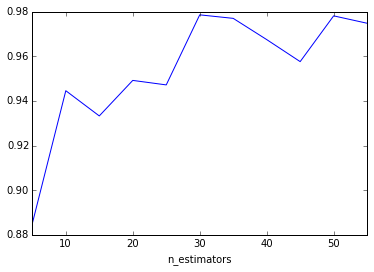

In [482]:
df[(df['max_depth'] == 5) & (df['max_features'] == 5)].groupby(['n_estimators'])['score'].max().plot()
print df[(df['max_depth'] == 5) & (df['max_features'] == 5)].groupby(['n_estimators']).max()

It looks like when we vary just the n_estimators that the general trend is that the score improves, however there does seem to be a point where increasing the n_estimators starts having a negative effect.  It also looks like the train_time and predict_time increase with the number of n_estimators with an exception around 45.

           max_features  n_estimators  predict_time     score  train_time
max_depth                                                                
5                     5             5      0.001212  0.885120    0.009097
10                    5             5      0.001059  0.900612    0.010387
15                    5             5      0.004969  0.892355    0.012497
20                    5             5      0.001073  0.933719    0.010451
25                    5             5      0.001130  0.918992    0.010764
30                    5             5      0.001122  0.916492    0.010105
35                    5             5      0.001206  0.926135    0.014757
40                    5             5      0.001030  0.909407    0.009922
45                    5             5      0.001144  0.911515    0.011356
50                    5             5      0.001089  0.918915    0.010071
55                    5             5      0.001076  0.910920    0.009948


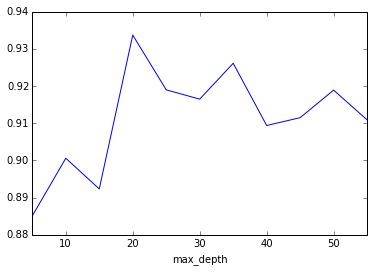

In [483]:
df[(df['n_estimators'] == 5) & (df['max_features'] == 5)].groupby(['max_depth'])['score'].max().plot()
print df[(df['n_estimators'] == 5) & (df['max_features'] == 5)].groupby(['max_depth']).max()

If we vary just the max_depth, it looks like after a max_depth of 20 the score doesn't improve.  The max_depth also seems to not have a direct correlation in train_time and predict_time to the max_depth.  I would have expected a linear correlation, but perhaps randomness of the forest generator causes this to not be perfectly linear.

              max_depth  n_estimators  predict_time     score  train_time
max_features                                                             
5                     5             5      0.001212  0.885120    0.009097
10                    5             5      0.008304  0.893923    0.013568
15                    5             5      0.001039  0.927807    0.015845
20                    5             5      0.000978  0.892226    0.015296
25                    5             5      0.001013  0.902374    0.019150
30                    5             5      0.002741  0.923023    0.046903
35                    5             5      0.001221  0.903054    0.023512
40                    5             5      0.000981  0.877147    0.024689
45                    5             5      0.001035  0.885604    0.028008
50                    5             5      0.001025  0.866880    0.029691
55                    5             5      0.001110  0.889824    0.038660


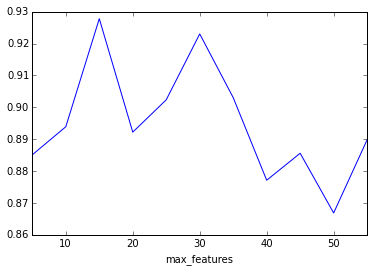

In [484]:
df[(df['n_estimators'] == 5) & (df['max_depth'] == 5)].groupby(['max_features'])['score'].max().plot()
print df[(df['n_estimators'] == 5) & (df['max_depth'] == 5)].groupby(['max_features']).max()

If we vary just the max_features, it looks like after 15 the score doesn't improve.  Interestingly enough the max_features seems to have no direct correlation between # of max_features and predict_time and train_time.

**Dimensionality Reduction - PCA**

Principal Component Analysis is a very powerful unsupervised method for dimensionality reduction in data. 

Apply dimensionality reduction technique PCA (Principle Component Analysis) on the prev dataset - load_digits(). 
Use the sklearn inbuilt tool sklearn.decomposition.PCA

Print the shape of the matrix before and after the application of PCA on the dataset. Using variance, analyze the ammount of information thrown away and plot the variance(cumulative) against the number of components  

Try other dimensionality reduction techniques - sklearn.decomposition.RandomizedPCA, sklearn.decomposition.FastICA  as well 
(this extended analysis need not be submitted as part of homework)


In [394]:
#print the shape before and after the PCA
print "Before PCA: %s" % str(digits.data.shape)

from sklearn.decomposition import PCA
K=30
pca = PCA(n_components=K)
# pca.fit(M)
pca.fit(digits.data)
T=pca.transform(digits.data)
print "After PCA: %s" % str(T.shape)

Before PCA: (1797, 64)
After PCA: (1797, 30)


[ 0.14890594  0.13618771  0.11794594  0.08409979  0.05782415  0.0491691
  0.04315987  0.03661373  0.03353248  0.03078806  0.02372341  0.02272697
  0.01821863  0.01773855  0.01467101  0.01409716  0.01318589  0.01248138
  0.01017718  0.00905617  0.00889538  0.00797123  0.00767493  0.00722904
  0.00695889  0.00596081  0.00575615  0.00515158  0.0048954   0.00428888]


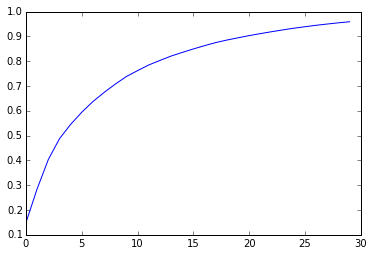

In [395]:
cumulative_explained = cumsum(pca.explained_variance_ratio_) 
plot(cumulative_explained);

print pca.explained_variance_ratio_[:30]

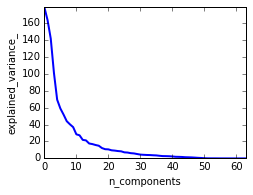

In [317]:
from sklearn import linear_model, decomposition, datasets
from sklearn.pipeline import Pipeline
from sklearn.grid_search import GridSearchCV

logistic = linear_model.LogisticRegression()

pca = decomposition.PCA()
pipe = Pipeline(steps=[('pca', pca), ('logistic', logistic)])

digits = datasets.load_digits()
X_digits = digits.data
y_digits = digits.target

###############################################################################
# Plot the PCA spectrum
pca.fit(X_digits)

plt.figure(1, figsize=(4, 3))
plt.clf()
plt.axes([.2, .2, .7, .7])
plt.plot(pca.explained_variance_, linewidth=2)
plt.axis('tight')
plt.xlabel('n_components')
plt.ylabel('explained_variance_')

In [ ]:
#Try other dimensionality reduction techniques - sklearn.decomposition.RandomizedPCA, sklearn.decomposition.FastICA  as well 
#(this extended analysis need not be submitted as part of homework)
# bonus??

Weather Questions

To get to these coordinate on Google Maps, type the latitude and longitude in decimal in the search box or use:
https://www.google.com/maps/place/72%C2%B018'00.0%22S+170%C2%B013'00.1%22E/@-72.3,170.216694,17z/data=!3m1!4b1!4m2!3m1!1s0x0:0x0

<span style="color:red">HW questions</span>

   1. Waiting for somebody to write a script that will do that automatically from python i.e write a script in python return the google maps url when passed with the latitude and longitudinal values of the place
   2. Can you create a map where the denity of points is represented as a density map (topographical map)?
   3. Can you create a map that would represent, using color, the values of a chosen column (Mean, Std, V0,V1 etc.)? What conclusions can you draw from this map?


In [218]:
#1 Q: Waiting for somebody to write a script that will do that automatically from python
# from the message board
#  1) The script is expected to take latitude and longitude and generate the google maps url corresponding to the input coordinates.
# I have updated the notebooks to explain the same

# clarification from the new lecture posted
# i.e write a script in python return the google maps url when passed with the latitude and longitudinal
# values of the place

# weather 1 answer
# example url https://www.google.com/maps/place/72%C2%B018'00.0%22S+170%C2%B013'00.1%22E/@-72.3,170.216694,17z/data=!3m1!4b1!4m2!3m1!1s0x0:0x0
# the google api supports multiple formats for querying google maps
# the example above is harder to parse, the official api also supports doing a query based upon a simplier lat / lon format
# which I will use below
import webbrowser
def plot_on_google(lat, lon, load_url=False):
    url = "http://maps.google.com/maps?q=loc:%s,%s" % (lat, lon)
    if load_url:
        webbrowser.open_new(url)
    return url

# answer to #1
print plot_on_google(51.03841, -114.01679)
    
# bonus, automatically load the url
print plot_on_google(51.03841, -114.01679, True)

http://maps.google.com/maps?q=loc:51.03841,-114.01679
http://maps.google.com/maps?q=loc:51.03841,-114.01679


In [ ]:
# weather 2 Q: Can you create a map where the denity of points is represented as a density map (topographical map)?

# Based upon feedback on the message board
# 2)  I am not sure on this, but I would suggest that you go with the density of points based on location (lat,lng).
# Just a heatmap without distance based grouping should suffice.  Nonetheless, answers with an elevation based map will
# be treated as an acceptable decent answer as well.

In [69]:
%cd /local/mnt/c6sander/DSE200/data/weather

/local/mnt/c6sander/DSE200/data/weather


In [70]:
# load the data
colspecs = [(0, 11), (11, 21), (21, 31), (31, 38),(39,41),(41,72),(72,76),(76,80),(80,86)]
stations = pd.read_fwf('ghcnd-stations_buffered.txt', colspecs=colspecs, header=None, index_col=0,
                       names=['latitude','longitude','elevation','state','name','GSNFLAG','HCNFLAG','WMOID'])

In [71]:
# manipulate the data into lats / lons like we did in lecture
lons=stations.ix[:,'longitude'].values
lats=stations.ix[:,'latitude'].values
station_names=stations.index.values
ll=len(lons)
lonmin=-180;lonmax=180;latsmin=-80;latsmax=80;
select=(lons>lonmin) * (lons<lonmax)*(lats>latsmin)*(lats<latsmax)
print sum(select)
station_names=station_names[select]
print type(station_names)
lons=lons[select]
lats=lats[select]
print len(lons),len(lats),len(station_names)

85273
<type 'numpy.ndarray'>
85273 85273 85273


In [211]:
# create helper functions

from math import *
def bin_lat_lon(lats_in, lons_in):
    """
    bining algorithm from http://community.tableau.com/docs/DOC-1346
    This function will bin the data into sections to speed up graphing and reduce the number of points on the map
    so it is readable
    """
    bins = {}
    if lats.size != lons.size:
        raise RuntimeError("lats and lons aren't equal in size")
        
    for i in xrange(lats.size):
    #for i in xrange(1000):
        # bin 1 size
        # BIN1: ROUND(DEGREES(2*ATAN(EXP(ROUND(2*LN(TAN(RADIANS([Latitude]))+1/COS(RADIANS([Latitude]))),1)/2))-PI()/2),2)
        # lat_ans = round(degrees(2*atan(exp(round(2*log(tan(radians(lats_in[i]))+1/cos(radians(lats_in[i]))), 1)/2))-pi/2),2)
        
        # bin 3 size
        # BIN 3: ROUND(DEGREES(2*ATAN(EXP(ROUND(LN(TAN(RADIANS([Latitude]))+1/COS(RADIANS([Latitude]))),2)))-PI()/2),3)
        lat_ans = round(degrees(2*atan(exp(round(log(tan(radians(lats_in[i]))+1/cos(radians(lats_in[i]))), 2)))-pi/2), 3)
        
        # bin 6 size
        # ROUND(DEGREES(2*ATAN(EXP(ROUND(LN(TAN(RADIANS([Latitude]))+1/COS(RADIANS([Latitude]))),3)))-PI()/2),4)
        # lat_ans = round(degrees(2*atan(exp(round(log(tan(radians(lats_in[i]))+1/cos(radians(lats_in[i]))), 3)))-pi/2), 4)
        if lat_ans not in bins:
            bins[lat_ans] = {}
    
        # bin 1 size
        # BIN1: ROUND(DEGREES(ROUND(2*RADIANS([Longitude]),1)/2),2)
        # lon_ans = round(degrees(round(2*radians(lons_in[i]), 1)/2), 2)
        
        # bin 3 size
        # bin 3: ROUND(DEGREES(ROUND(RADIANS([Longitude]),2)),3)
        lon_ans = round(degrees(round(radians(lons_in[i]), 2)), 3)
        
        # bin 6 size
        # bin 6: ROUND(DEGREES(ROUND(RADIANS([Longitude]),3)),4)
        # lon_ans = round(degrees(round(radians(lons_in[i]), 3)), 4)
        if lon_ans not in bins[lat_ans]:
            bins[lat_ans][lon_ans] = 1
        else:
            bins[lat_ans][lon_ans] += 1
    return bins
    

def get_marker_color(count):
    """
    This helper function will change the color of the marker and size based upon the number of 
    items within the bin'ed data
    """
    debug = False
    if count <= 6:
        return ('k.', 1)
    elif count <= 12:
        if debug:
            print "count: %s" % count
        return ('b.', 2)
    elif count <= 18:
        if debug:
            print "count: %s" % count
        return ('g.', 3)
    elif count <= 24:
        if debug:
            print "count: %s" % count
        return ('y.', 4)
    else:
        if debug:
            print "count: %s" % count
        return ('r.', 5)

In [212]:
# apply the bin'ing and see what the maximum count is
ret = bin_lat_lon(lats, lons)
print len(ret)
ans = 0
total_size = 0
for lat in ret:
    for lon in ret[lat]:
        total_size += 1
        if ret[lat][lon] > ans:
            ans = ret[lat][lon]
print "total_size: %s" % total_size
print ans

324
total_size: 14311
266


In [219]:
for lat in ret:
    for lon in ret[lat]:
        x, y = m(lon, lat)
        (marker, marker_size) = get_marker_color(ret[lat][lon])
        # print "marker: %s" % marker
        # print "marker_size: %s" % marker_size

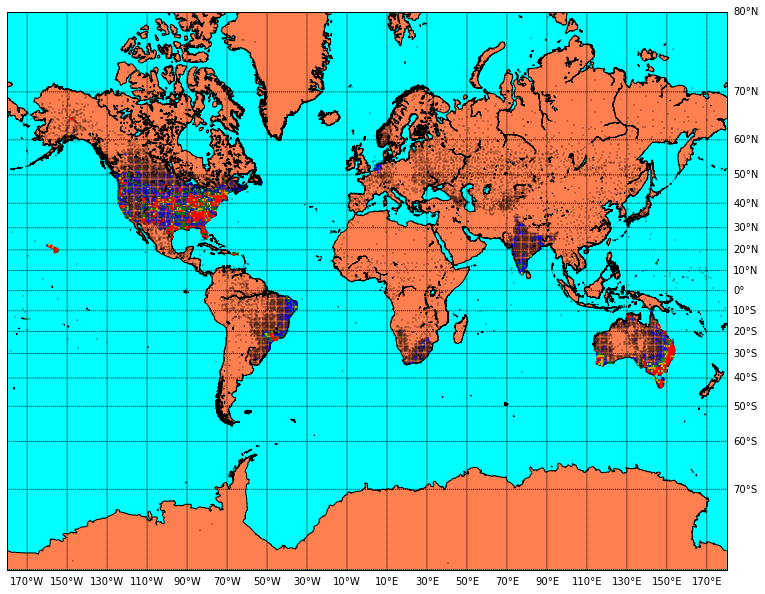

In [220]:
# http://matplotlib.org/basemap/users/merc.html

from mpl_toolkits.basemap import Basemap, cm
import numpy as np
import matplotlib.pyplot as plt
# llcrnrlat,llcrnrlon,urcrnrlat,urcrnrlon
# are the lat/lon values of the lower left and upper right corners
# of the map.
# lat_ts is the latitude of true scale.
# resolution = 'i' means use intermediate resolution coastlines.
plt.figure(figsize=(15,10),dpi=300)
m = Basemap(projection='merc',llcrnrlat=latsmin,urcrnrlat=latsmax,\
            llcrnrlon=lonmin,urcrnrlon=lonmax,lat_ts=20,resolution='i')
m.drawcoastlines()
m.fillcontinents(color='coral',lake_color='aqua')
# draw parallels and meridians.
parallels = np.arange(-80,81,10.)
# labels = [left,right,top,bottom]
m.drawparallels(parallels,labels=[False,True,True,False])
meridians = np.arange(10.,351.,20.)
m.drawmeridians(meridians,labels=[True,False,False,True])

#m.drawparallels(np.arange(-90.,91.,30.))
#m.drawmeridians(np.arange(-180.,181.,60.))
m.drawmapboundary(fill_color='aqua')

# draw map with markers for locations
for lat in ret:
    for lon in ret[lat]:
        x, y = m(lon, lat)
        (marker, marker_size) = get_marker_color(ret[lat][lon])
        m.plot(x, y, marker, markersize=marker_size)

<matplotlib.colorbar.Colorbar instance at 0x7f27f1682fc8>

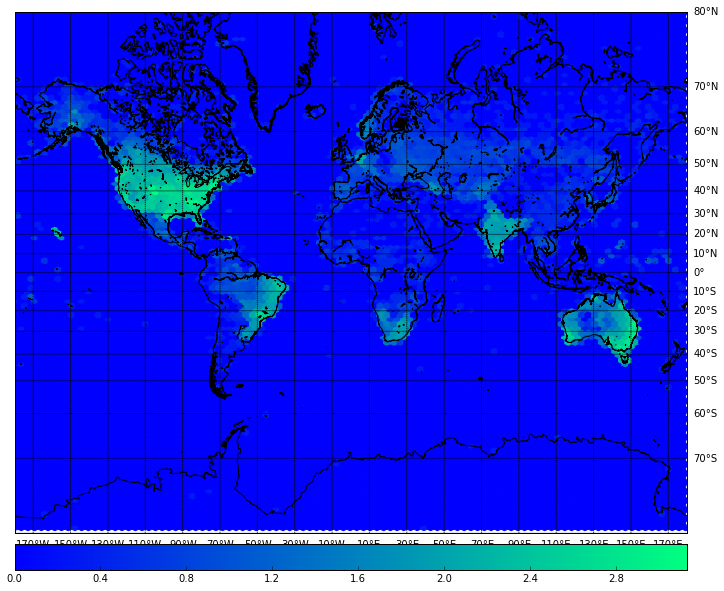

In [405]:
#hexbin example
# http://matplotlib.org/basemap/users/merc.html

from mpl_toolkits.basemap import Basemap, cm
import numpy as np
import matplotlib.pyplot as plt
# llcrnrlat,llcrnrlon,urcrnrlat,urcrnrlon
# are the lat/lon values of the lower left and upper right corners
# of the map.
# lat_ts is the latitude of true scale.
# resolution = 'i' means use intermediate resolution coastlines.
plt.figure(figsize=(15,10),dpi=300)
m = Basemap(projection='merc',llcrnrlat=latsmin,urcrnrlat=latsmax,\
            llcrnrlon=lonmin,urcrnrlon=lonmax,lat_ts=20,resolution='i')
m.drawcoastlines()
#m.fillcontinents(color='coral',lake_color='aqua')
# draw parallels and meridians.
parallels = np.arange(-80,81,10.)
# labels = [left,right,top,bottom]
m.drawparallels(parallels,labels=[False,True,True,False])
meridians = np.arange(10.,351.,20.)
m.drawmeridians(meridians,labels=[True,False,False,True])

#m.drawparallels(np.arange(-90.,91.,30.))
#m.drawmeridians(np.arange(-180.,181.,60.))
#m.drawmapboundary(fill_color='aqua')

# draw map with markers for locations
x, y = m(lons, lats)
m.hexbin(x, y, bins='log', cmap='winter')
m.colorbar(location='bottom')

#for lat in ret:
#    for lon in ret[lat]:
#        x, y = m(lon, lat)
#        (marker, marker_size) = get_marker_color(ret[lat][lon])
#        m.plot(x, y, marker, markersize=marker_size)

In [230]:
#weather homework #3
#3. Can you create a map that would represent, using color, the values of a chosen column
# (Mean, Std, V0,V1 etc.)? What conclusions can you draw from this map?

# from the message board
# 3) This requires you to write a function which takes a column as a parameter and outputs a map with
# the column values color coded on the map.

# data prep to get the information in the same state as in the weather notebook
header=['station','measurement','year']+range(1,366)
# D=pandas.DataFrame(columns=header)
Data = pd.read_csv('SAMPLE_TMAX.csv',header=None,names=header)
G=Data.ix[:,3:]
G[G<-400]=np.nan   #remove outliers
G[G>500]=np.nan
G=G/10   # temp / 10 is the temp in celsius
Data.ix[:,3:]=G
G=G.transpose()
Data.head()
# a simple scale function to normalize the data-frame row-by-row
from numpy import mean, std
def scale_temps(Din):
    matrix=Din.iloc[:,3:]
    Dout=Din.loc[:,['station','year']+range(1,366)]
    Mean=mean(matrix, axis=1).values
    Dout['Mean']=Mean
    Std= std(matrix, axis=1).values
    Dout['Std']=Std
    # Decided not to normalize each year to have mean zero and std 1
    # tmp = pd.DataFrame((matrix.values - Mean[:,np.newaxis])/Std[:,newaxis],columns=range(1,366))
    # print tmp.head()
    # Dout.loc[:,1:365]=matrix.values
    Dout.loc[:,4:369]=matrix.values
    return Dout
Dout=scale_temps(Data)
#reorder the columns
Dout=Dout[['station','year','Mean','Std']+range(1,366)]
Dout.head()

,station,year,Mean,Std,1,2,3,4,5,6,...,356,357,358,359,360,361,362,363,364,365
0,USC00507570,2005,4.4,6.1,6.7,4.4,6.7,4.4,6.1,1.7,...,4.4,-2.8,-3.9,-3.3,-1.7,3.9,6.1,5.0,6.1,6.1
1,NOE00135018,1959,3.9,6.1,NaN,NaN,NaN,NaN,NaN,NaN,...,6.5,8.0,5.8,3.1,4.5,4.2,3.2,1.6,2.0,2.2
2,KZ000036546,1982,-13.5,-9.9,NaN,NaN,NaN,NaN,-13.9,NaN,...,-8.0,NaN,NaN,-7.3,NaN,NaN,NaN,-17.0,-16.6,-16.0
3,USC00054664,1964,-15.0,-15.0,NaN,NaN,NaN,NaN,NaN,NaN,...,2.2,6.7,9.4,7.8,3.3,NaN,NaN,3.9,5.6,-3.9
4,CUW00011706,1981,31.1,31.1,30.0,28.3,30.0,28.3,30.0,30.0,...,27.8,28.9,30.0,31.1,32.2,31.1,31.1,32.2,32.2,31.1


In [231]:
M=Dout.iloc[:,4:]
M=M.dropna(axis=0)
(columns,rows)=shape(M)
Mean=np.mean(M, axis=0).values

print (columns,rows), shape(Mean)
C=np.zeros([columns,columns])   # Sum
N=np.zeros([columns,columns])   # Counter of non-nan entries
print shape(M)
from sklearn.decomposition import PCA
K=5
pca = PCA(n_components=K)
pca.fit(M)
T=pca.transform(M)
T.shape

(8914, 365) (365,)
(8914, 365)


(8914, 5)

In [232]:
Tcomp=np.transpose(pca.components_)

In [236]:
k=5
Eig=np.matrix(Tcomp[:,:k])
print Eig
#print [np.linalg.norm(U[:,i]) for i in range(k)]
#matrix=np.matrix(Dout.ix[:,1:365])-Mean
matrix=np.matrix(Dout.ix[:,4:369])-Mean
matrix[np.isnan(matrix)]=0
print shape(Eig),shape(matrix)
Prod=matrix*Eig;
print shape(Prod)

[[-0.07428905 -0.05231634 -0.019518    0.02700161 -0.00865179]
 [-0.074558   -0.05323091 -0.02601696  0.03724493 -0.00931191]
 [-0.07428905 -0.05231634 -0.019518    0.02700161 -0.00865179]
 ..., 
 [-0.07197641 -0.048015   -0.05534842 -0.0388817  -0.05569508]
 [-0.07252296 -0.04805028 -0.06526565 -0.04189705 -0.05135051]
 [-0.07318033 -0.04839319 -0.06594008 -0.04002781 -0.05479603]]
(365, 5) (20000, 365)
(20000, 5)


In [237]:
for i in range(k-1,-1,-1):
    Ser=pd.Series(np.array(Prod)[:,i],index=Dout.index)
    Dout.insert(4,'V'+str(i),Ser)
Dout.head()

,station,year,Mean,Std,V0,V1,V2,V3,V4,1,...,356,357,358,359,360,361,362,363,364,365
0,USC00507570,2005,4.4,6.1,142.491478,-53.257786,35.260004,1.605482,-22.489354,6.7,...,4.4,-2.8,-3.9,-3.3,-1.7,3.9,6.1,5.0,6.1,6.1
1,NOE00135018,1959,3.9,6.1,57.645085,-51.277198,21.439552,19.754515,2.087847,NaN,...,6.5,8.0,5.8,3.1,4.5,4.2,3.2,1.6,2.0,2.2
2,KZ000036546,1982,-13.5,-9.9,54.119308,25.652617,5.267816,-4.488388,0.019445,NaN,...,-8.0,NaN,NaN,-7.3,NaN,NaN,NaN,-17.0,-16.6,-16.0
3,USC00054664,1964,-15.0,-15.0,20.679100,9.290225,21.272174,20.635318,5.385268,NaN,...,2.2,6.7,9.4,7.8,3.3,NaN,NaN,3.9,5.6,-3.9
4,CUW00011706,1981,31.1,31.1,-314.322218,-24.531506,-8.919996,-5.873874,-4.591208,30.0,...,27.8,28.9,30.0,31.1,32.2,31.1,31.1,32.2,32.2,31.1


In [245]:
Djoined=Dout.join(stations,on='station')
Djoined.head()

,station,year,Mean,Std,V0,V1,V2,V3,V4,1,...,364,365,latitude,longitude,elevation,state,name,GSNFLAG,HCNFLAG,WMOID
0,USC00507570,2005,4.4,6.1,142.491478,-53.257786,35.260004,1.605482,-22.489354,6.7,...,6.1,6.1,60.2036,-154.3164,79.2,K,PORT ALSWORTH,NaN,NaN,NaN
1,NOE00135018,1959,3.9,6.1,57.645085,-51.277198,21.439552,19.754515,2.087847,NaN,...,2.0,2.2,59.2300,10.3481,26.0,NaN,MELSOM,NaN,NaN,NaN
2,KZ000036546,1982,-13.5,-9.9,54.119308,25.652617,5.267816,-4.488388,0.019445,NaN,...,-16.6,-16.0,48.5500,83.6830,427.0,NaN,KURCUM,NaN,NaN,36546
3,USC00054664,1964,-15.0,-15.0,20.679100,9.290225,21.272174,20.635318,5.385268,NaN,...,5.6,-3.9,40.0575,-106.3681,2273.8,O,KREMMLING,NaN,NaN,NaN
4,CUW00011706,1981,31.1,31.1,-314.322218,-24.531506,-8.919996,-5.873874,-4.591208,30.0,...,32.2,31.1,19.9000,-75.1500,16.2,NaN,GUANTANAMO BAY NAS,GSN,NaN,78367


In [246]:
df = Djoined.ix[:,['latitude', 'longitude','elevation','Mean','Std','V0','V1','V2']]

In [307]:
# 3) This requires you to write a function which takes a column as a parameter and outputs a map with
# the column values color coded on the map.

def plot_weather_data(column_label):
    """
    This function takes a column from the weather dataframe and outputs a map with the column values color coded on
    the map
    
    :param str column_label: the label of the data to plot
    """
    max_value = abs(df[column_label].max())
    min_value = abs(df[column_label].min())
    def get_marker_color2(value):
        """
        This helper function will change the color of the marker and size based upon value
        The value is put into 1 of 5 categories based upon the maximum size of the chosen column
        """
        if np.isnan(value):
            value = 0
        if min_value <= value < min_value/2:
            return ('k.', 1)
        elif min_value/2 <= value <= 0:
            return ('b.', 1)
        elif 0 < value < max_value/3:
            return ('g.', 1)
        elif max_value/3 <= value < max_value/4:
            return ('y.', 1)
        else:
            return ('r.', 1)
    plt.figure(figsize=(15,10),dpi=300)
    m = Basemap(projection='merc',llcrnrlat=latsmin,urcrnrlat=latsmax,\
            llcrnrlon=lonmin,urcrnrlon=lonmax,lat_ts=20,resolution='i')
    m.drawcoastlines()
    m.fillcontinents(color='coral',lake_color='aqua')
    # draw parallels and meridians.
    parallels = np.arange(-80,81,10.)
    # labels = [left,right,top,bottom]
    m.drawparallels(parallels,labels=[False,True,True,False])
    meridians = np.arange(10.,351.,20.)
    m.drawmeridians(meridians,labels=[True,False,False,True])

    #m.drawparallels(np.arange(-90.,91.,30.))
    #m.drawmeridians(np.arange(-180.,181.,60.))
    m.drawmapboundary(fill_color='aqua')

    # draw map with markers for locations
    sorted_df = df.sort(column_label)
    for i in xrange(sorted_df.shape[0]):
    # for i in xrange(100):
        x, y = m(sorted_df['longitude'].iloc[i],sorted_df['latitude'].iloc[i])
        # print "value: %s" % df[column_label].iloc[i]
        (marker, marker_size) = get_marker_color2(sorted_df[column_label].iloc[i])
        # print "marker: %s" % marker
        # print "marker_size: %s" % marker_size
        m.plot(x, y, marker, markersize=marker_size)


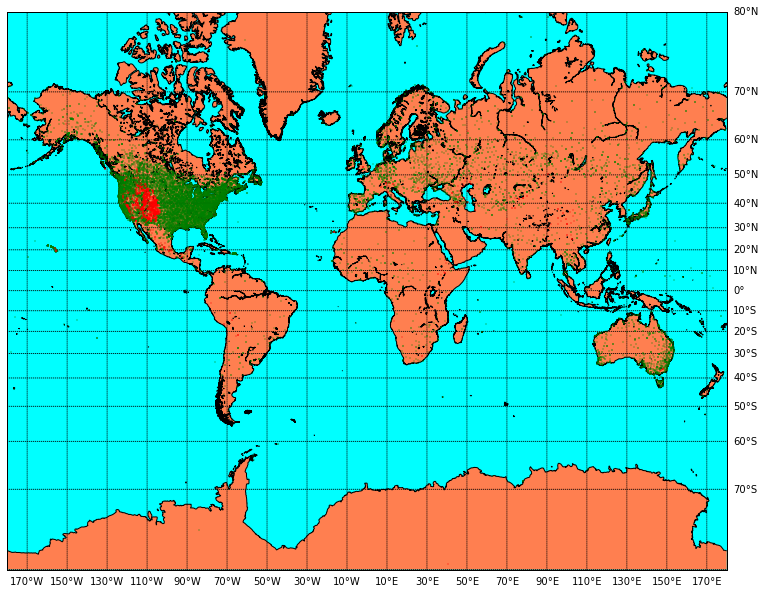

In [311]:
plot_weather_data('elevation')

We can plot the elevation and see that there is a higher elevation in the midwest of the US then compared to the rest of the US.  This is easy to see since the density of weather stations in the US is pretty dense.  Other countries are harder to tell because the density of stations.  For elevations that are less than 0 (ie: black and blue) we can assume that these stations are below sea level (since they're negative) and probably and checking on conditions in the ocean.  To learn amount about the positive elevations I probably need to bin the data in more then 3 colors, but in general we can see some higher elevation areas in the mid-west of the US, China and South America.

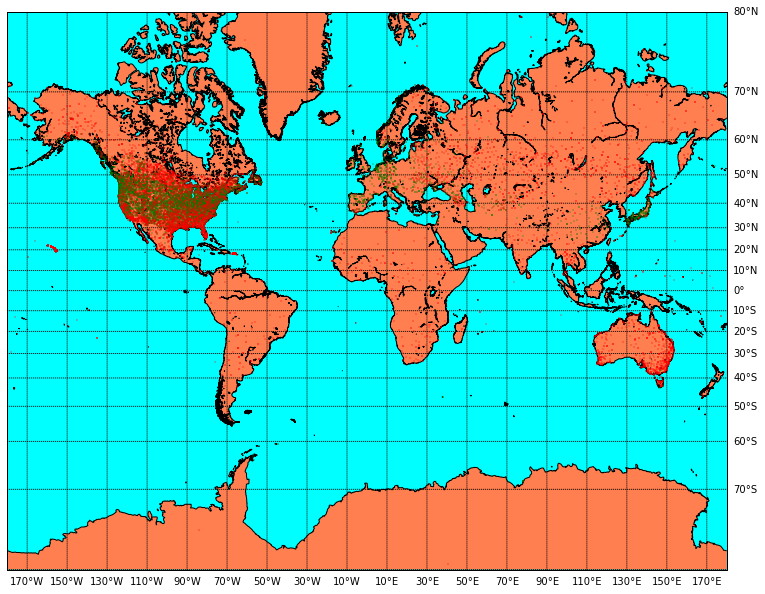

In [312]:
plot_weather_data('Mean')

For the mean we can see that there are a lot of high value means and a lot of negative means.  Perhaps this means that the mean calculation is being heavily swayed by the elevation data since there are still a lot of negative values around the coasts similar to what was see in the previous map.

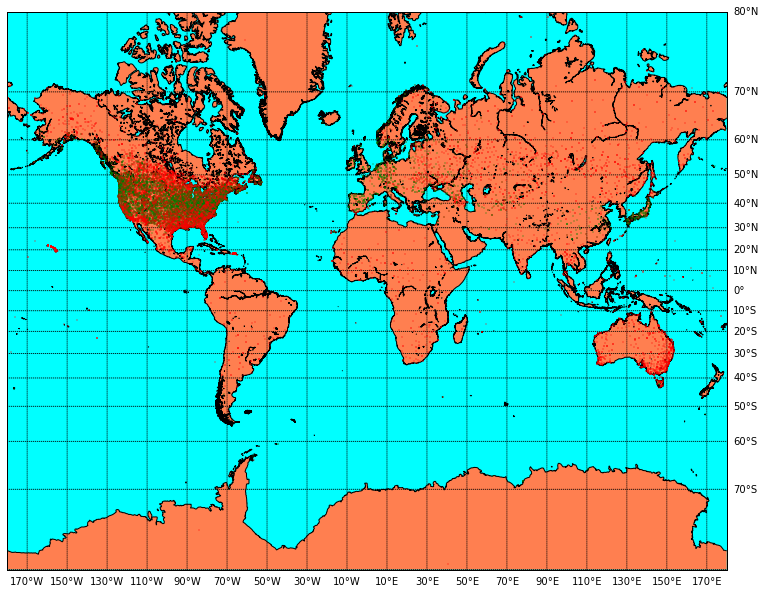

In [313]:
plot_weather_data('Std')

A lot of the points have a high standard deviation.  This means that the range of the data is highly variable.

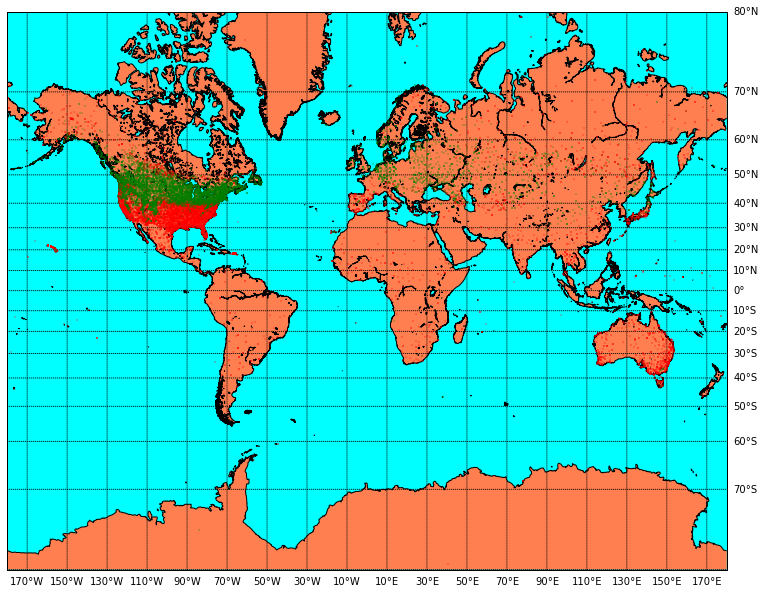

In [308]:
plot_weather_data('V0')

As expected with the first eigenvalue we see a almost an equal amount of red, green and black.  This implies that the spread of the data is high and in this case it almost looks like there is a green pass going through the world at between latitude 40 to 60 in an arc through the US and then up into Europe.  The trend isn't perfect since it then go downwards in China.

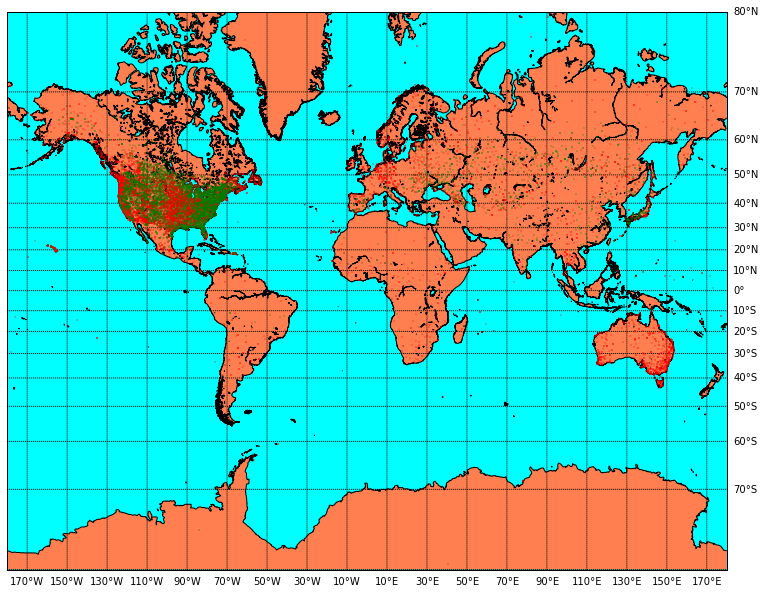

In [309]:
plot_weather_data('V1')

It looks like the data is getting more normalized as we go higher in the eigenvalues.  Since the first eigenvalue represents the greatest dimensionality reduction in the data set, it seems to make sense that higher order eigenvalues wouldn't have as much data variation as the lower order or the first few eigenvalues. There is more green in the V1 then in the V0 map.

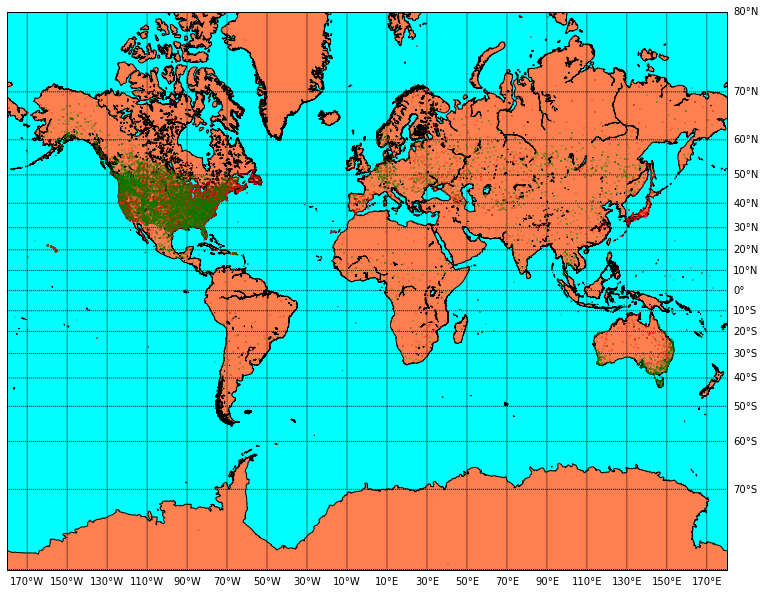

In [310]:
plot_weather_data('V2')

The data is getting more normalized as we go higher in the eigenvalues.  There is even more green in the V2 map then compared to the V1 map.